In [1]:
suppressPackageStartupMessages({
    library(data.table)
    library(dplyr)
    library(SingleCellExperiment)
    library(Seurat)
    library(scran)
    library(scater)
    library(destiny)
})
source('settings.R')

In [3]:
#io = list()
io$atlas_sce = "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/embryo_sce.rds"
#outdir
io$outdir = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/results/blood_waves/'
dir.create(io$outdir, recursive=T, showWarning=F)

args = list()
args$celltypes = c('Nascent mesoderm', 'Mixed mesoderm', 'Haematoendothelial progenitors', 'Mesenchyme') # , 'Allantois' already too late
args$features = 2500
args$npcs = 10

In [4]:
extended.sce = readRDS(io$atlas_sce)
meta = colData(extended.sce) %>% 
    as.data.table() %>% 
    .[embryo_version=='Original']
# Subset to original atlas
original_sce = extended.sce[,as.character(meta$cell)]
rm(extended.sce)

In [5]:
# Rename ensemble IDs to gene names in the atlas
gene_metadata <- fread(io$gene_metadata) %>% 
    .[,c("chr","ens_id","symbol")] %>%
     .[symbol!="" & ens_id%in%rownames(original_sce)] %>%
     .[!duplicated(symbol)]


In [6]:
original_sce <- original_sce[rownames(original_sce) %in% gene_metadata$ens_id,]
foo <- gene_metadata$symbol; names(foo) <- gene_metadata$ens_id
rownames(original_sce) <- foo[rownames(original_sce)]

In [ ]:
keep = meta[celltype_PijuanSala2019 %in% args$celltypes] %>%
    .[!cell %in% meta[celltype_PijuanSala2019 == 'Haematoendothelial progenitors' & stage %in% c('E8.0', 'E8.25', 'E8.5'), cell]] %>%
    .[stage%in% c('E6.5', ' E6.75', 'E7.0', 'E7.25')] # , 'E7.5' whithout E7.5 looks like it will also be fine

In [ ]:
sce = original_sce[,as.character(keep$cell)]

In [ ]:
seurat = as.Seurat(sce, data = 'counts')

In [ ]:
seurat = NormalizeData(seurat)

In [ ]:
sce = as.SingleCellExperiment(seurat)

In [ ]:
rm(seurat)

In [ ]:
decomp <- modelGeneVar(sce)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=args$features) %>% rownames

# Subset SingleCellExperiment
sce_filt <- sce[hvgs,]

In [ ]:
sce_filt <- runPCA(sce_filt, ncomponents = args$npcs, ntop=args$features)
pca.dt <- reducedDim(sce_filt,"PCA") %>% round(3) %>% as.data.table(keep.rownames = T) %>% setnames("rn","cell") %>%
    merge(.,meta, by='cell')

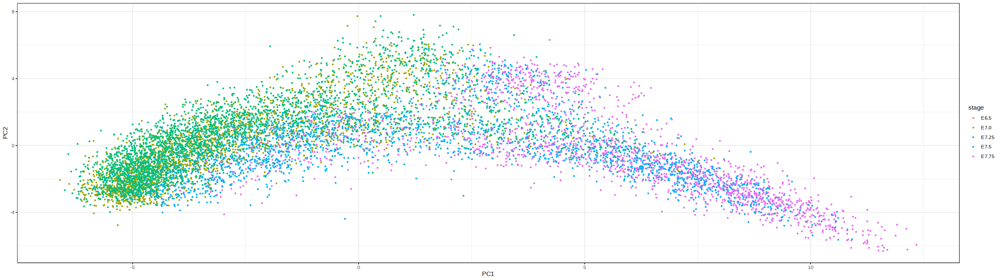

In [ ]:
ggplot(pca.dt, aes(PC1, PC2, col=stage)) + 
    geom_point(size=0.5) + 
    theme_bw()

In [ ]:
dm <- DiffusionMap(reducedDim(sce_filt,"PCA")[,-2], n_pcs=args$n_pcs) # remove PC2 bc it splits too much by stage

In [ ]:
dm.dt <- dm@eigenvectors[,c(1,2)] %>% round(10) %>% as.data.table(keep.rownames = T) %>% setnames("rn","cell") %>%
    merge(.,meta, by='cell')

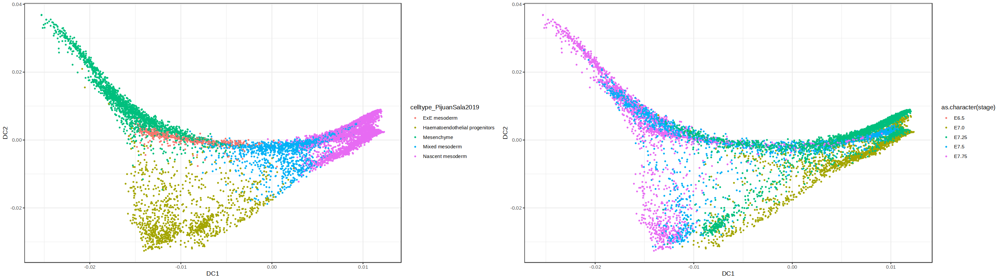

In [ ]:
options(repr.plot.width=25)
p1 = ggplot(dm.dt, aes(DC1, DC2, col=celltype_PijuanSala2019)) + 
    geom_point(size=0.5) + 
    theme_bw()
p2 = ggplot(dm.dt, aes(DC1, DC2, col=as.character(stage))) + 
    geom_point(size=0.5) + 
    theme_bw()
ggarrange(p1, p2)

### Get pseudotime

In [150]:
suppressPackageStartupMessages(library(slingshot))

In [151]:
lin1 <- getLineages(sce_filt, , clusterLabels = 'celltype_PijuanSala2019', start.clus = 'Nascent mesoderm')

Dimensionality reduction not explicitly chosen. Continuing with PCA



In [152]:
crv1 <- getCurves(lin1)

In [153]:
rd = dm@eigenvectors[,c(1,2)]

In [154]:
reducedDim(crv1, "DiffusionMap") <- dm@eigenvectors[,c(1,2)]

In [155]:
curves <- embedCurves(crv1, "DiffusionMap")
time1 <- slingCurves(curves)[[1]] # only 1 path.
time1 <- data.frame(time1$s[time1$ord,])

time2 <- slingCurves(curves)[[2]] # only 1 path.
time2 <- data.frame(time2$s[time2$ord,])

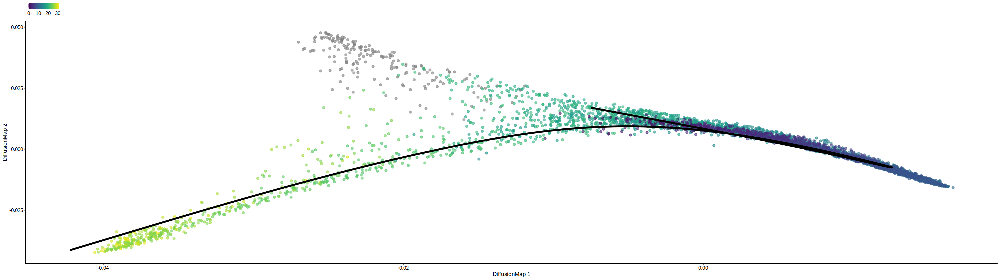

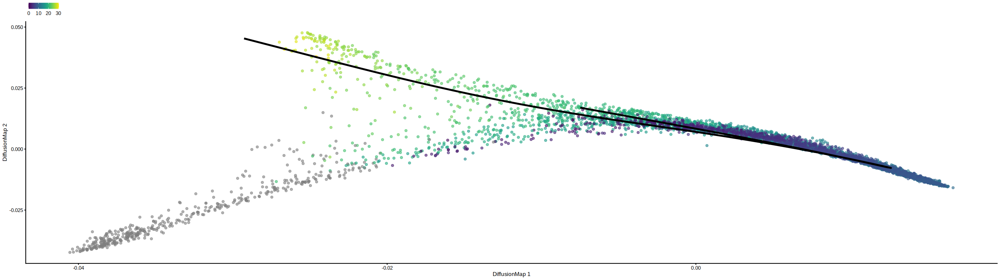

In [156]:
plotReducedDim(crv1, dimred = "DiffusionMap", colour_by="slingPseudotime_1", ncomponents = c(1,2)) +
  geom_path(data=time1, aes(x=DC1, y=DC2), size=1.2) + theme(legend.position="top", legend.title = element_blank())

plotReducedDim(crv1, dimred = "DiffusionMap", colour_by="slingPseudotime_2", ncomponents = c(1,2)) +
  geom_path(data=time2, aes(x=DC1, y=DC2), size=1.2) + theme(legend.position="top", legend.title = element_blank())

# differential expression

In [160]:
rm(lin1)

In [161]:
suppressPackageStartupMessages(library(tradeSeq))


In [181]:
# First test with only highly variable genes!! Before testing with all genes (but def do test with all)
counts = sce_filt@assays@data$counts

Warning message:
“Removed 508 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


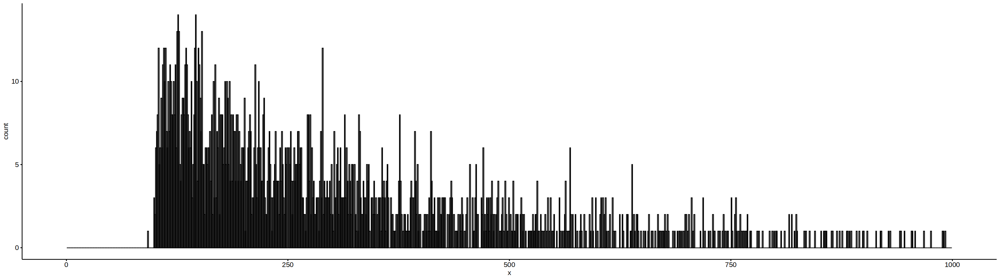

In [182]:
sum = rowSums(counts)
gghistogram(sum, bins = 1000) + xlim(0, 1000)

In [183]:
counts = counts[sum>300,]

Warning message:
“Removed 508 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


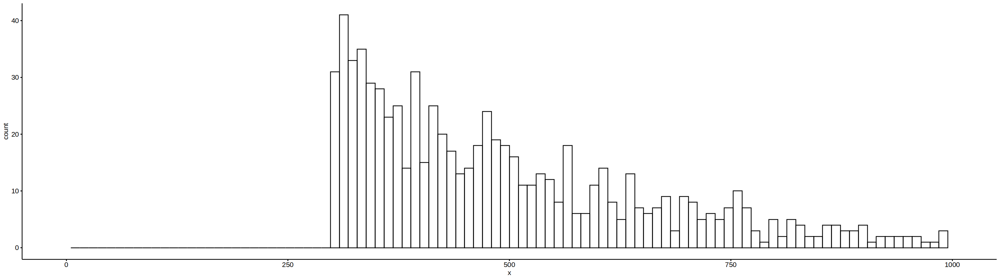

In [185]:
sum = rowSums(counts)
gghistogram(sum, bins = 100) + xlim(0, 1000)

In [36]:
# # incorporate this step but don't know how:
# icMat <- evaluateK(counts = counts, sds = lin1, k = 3:10, 
#                    nGenes = 200, verbose = T)

In [186]:
set.seed(7)
BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 16

pseudotime <- slingPseudotime(crv1, na = FALSE)
cellWeights <- slingCurveWeights(crv1)
sce_pt <- fitGAM(counts = counts, 
                 pseudotime = pseudotime, 
                 cellWeights = cellWeights,
                 nknots = 6, ,
                 parallel = TRUE,
                 BPPARAM=BPPARAM,
                 verbose = FALSE)

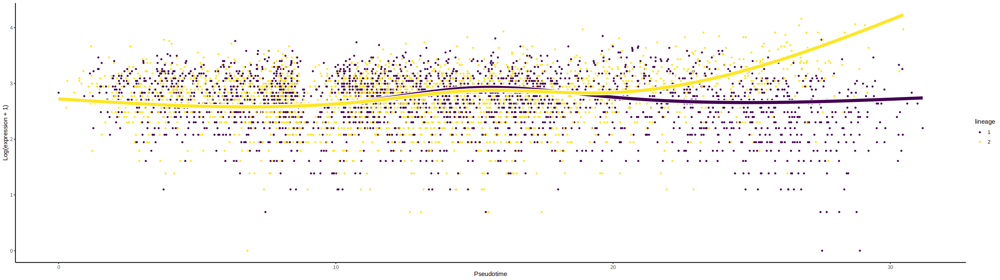

In [187]:
endRes <- diffEndTest(sce_pt)
o <- order(endRes$waldStat, decreasing = TRUE)
sigGene <- names(sce_pt)[o[1]]
plotSmoothers(sce_pt, counts, sigGene)

In [188]:
names(sce_pt)[o[5]]

[1] "Krt18"

In [189]:
patternRes <- patternTest(sce_pt)
oPat <- order(patternRes$waldStat, decreasing = TRUE)
head(rownames(patternRes)[oPat])

[1] "Hand1"  "Bex3"   "Wbp5"   "Krt18"  "Spin2c" "Foxf1"

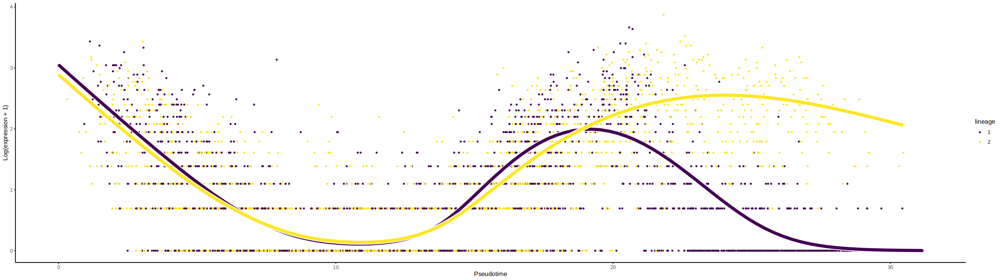

In [195]:
plotSmoothers(sce_pt, counts, gene = rownames(patternRes)[oPat][1])


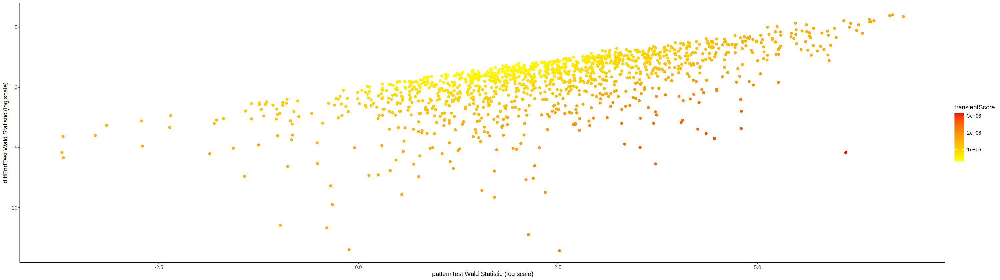

In [208]:
library(ggplot2)

patternRes$Gene <- rownames(patternRes)
patternRes$pattern <- patternRes$waldStat
patternRes <- patternRes[, c("Gene", "pattern")]

endRes$Gene <- rownames(endRes)
endRes$end <- endRes$waldStat
endRes <- endRes[, c("Gene", "end")]

compare <- merge(patternRes, endRes, by = "Gene", all = FALSE)
compare$transientScore <- 
  rank(-compare$end, ties.method = "min")^2 + rank(compare$pattern, ties.method = "random")^2

ggplot(compare, aes(x = log(pattern), y = log(end))) +
  geom_point(aes(col = transientScore)) +
  labs(x = "patternTest Wald Statistic (log scale)",
       y = "diffEndTest Wald Statistic (log scale)") +
  scale_color_continuous(low = "yellow", high = "red") +
  theme_classic()

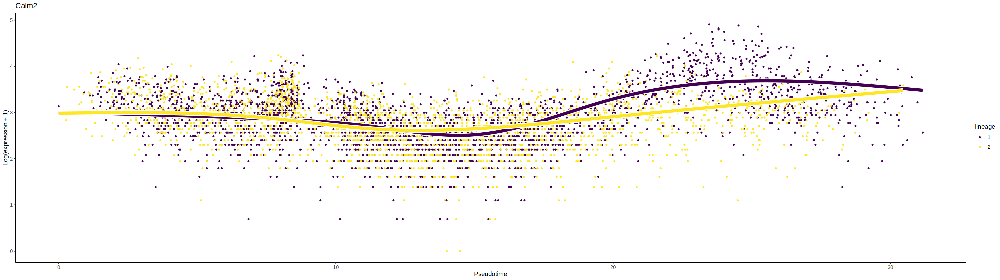

In [235]:
gene = as.data.table(compare)[order(-transientScore),Gene][1]
plotSmoothers(sce_pt, counts, gene = gene) + ggtitle(gene)

In [236]:
# This is the functino to detect the early differences!
earlyDERes <- earlyDETest(sce_pt, knots = c(1, 2))
oEarly <- order(earlyDERes$waldStat, decreasing = TRUE)
head(rownames(earlyDERes)[oEarly], 100)

[1] "Tal1"          "Parp11"        "Plet1"         "Fam122b"      
  [5] "Hey1"          "Snhg20"        "Comt"          "Phlda1"       
  [9] "Mageh1"        "Zcchc12"       "Tmem59l"       "Krt18"        
 [13] "Fam91a1"       "Apoe"          "Cfc1"          "Sgk1"         
 [17] "Mpc2"          "Neurl4"        "Foxf1"         "Slc6a8"       
 [21] "D1Ertd622e"    "Mesp1"         "Dsp"           "Ceacam10"     
 [25] "Pdlim3"        "C530008M17Rik" "Six2"          "Akr1b3"       
 [29] "Zfp949"        "Eif5"          "Kif26a"        "Dnajb4"       
 [33] "Etv2"          "Dab2"          "Cxx1b"         "Siah2"        
 [37] "Pou3f1"        "Slc25a4"       "Olfr655"       "Exoc3l"       
 [41] "Hand1"         "Trim41"        "Peak1"         "Ddc"          
 [45] "Agtrap"        "Mbd1"          "Hdac1"         "Loxl2"        
 [49] "Dpf3"          "Tecpr1"        "Meg3"          "Papd5"        
 [53] "Dll1"          "Ptgfrn"        "Gspt1"         "Igfbp2"       
 [57] "Gata2"         "Sct"           "Tmem164"       "Hspb1"        
 [61] "Stat6"         "Creg1"         "Gm5914"        "E2f8"         
 [65] "Cd24a"         "Mid1ip1"       "Phlda2"        "Cited1"       
 [69] "Tef"           "Nectin2"       "Rasgrp2"       "Calr"         
 [73] "Usp18"         "Ninj2"         "Hnrnpm"        "Cyp51"        
 [77] "Bmper"         "Zmat3"         "Smg1"          "Jun"          
 [81] "1700027J19Rik" "Pou5f1"        "Sh3bp5"        "Prpf40b"      
 [85] "Dlg5"          "Blnk"          "Id3"           "Zic5"         
 [89] "Myrfl"         "Lef1"          "Nnat"          "Eng"          
 [93] "Fev"           "Hmga2"         "Stard8"        "Msx1"         
 [97] "Krt8"          "Epha1"         "Fam129b"       "Rpl27"

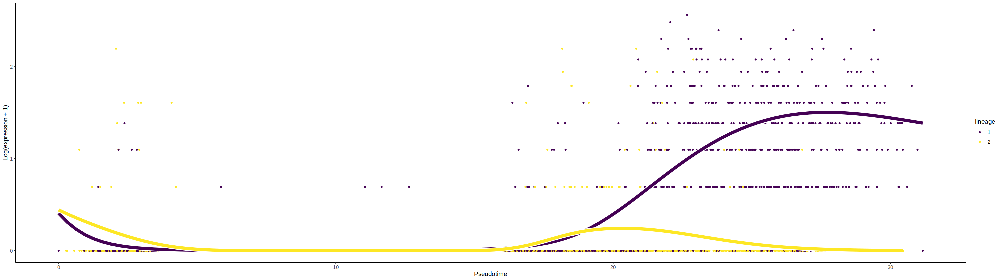

In [196]:
plotSmoothers(sce_pt, counts, gene = rownames(earlyDERes)[oEarly][1])


In [257]:
names(sce_pt)[o[1:100]]

[1] "Bex3"     "Wbp5"     "Hand1"    "Krt8"     "Krt18"    "Pmp22"   
  [7] "Spin2c"   "Foxf1"    "Car4"     "Csrp2"    "Slc2a1"   "Msx2"    
 [13] "Rbbp7"    "Lrpap1"   "T"        "Arl4c"    "Etv2"     "Pdlim4"  
 [19] "Phlda2"   "Cfc1"     "Actg1"    "Msx1"     "Peg3"     "Cd24a"   
 [25] "Fam212a"  "Bex1"     "Tmem88"   "Lmo2"     "Clic1"    "Slc2a3"  
 [31] "Egfl7"    "Mid1ip1"  "Phlda1"   "Rspo3"    "Tdgf1"    "Dusp9"   
 [37] "Tpd52l1"  "Peg10"    "Car2"     "Slc25a5"  "Lgals1"   "Ptch1"   
 [43] "Rap1a"    "Ccnd2"    "Cdkn1c"   "St3gal5"  "Lef1"     "Tceal8"  
 [49] "Pard6b"   "Klf6"     "Ckb"      "Igfbp4"   "Tuba1a"   "Ramp2"   
 [55] "Apoe"     "Pth1r"    "Cnn2"     "Daam1"    "Lrrfip1"  "Tagln"   
 [61] "Gadd45g"  "Junb"     "Snrpn"    "Nkd1"     "Smarcd3"  "Emb"     
 [67] "Frmd6"    "Hsd11b2"  "Gata2"    "Efna1"    "Fhl2"     "Basp1"   
 [73] "Pitx2"    "Rarg"     "Rasgrp2"  "Ppa1"     "H19"      "Kdr"     
 [79] "Dlk1"     "Ppp1r14a" "Ppp1r15a" "Tal1"     "Ier2"     "Mixl1"   
 [85] "Tgfb1"    "Anxa2"    "Cyp26a1"  "F2r"      "Tmem108"  "Fth1"    
 [91] "Impdh2"   "Myl9"     "Cdx2"     "Rpl14"    "Rpl10a"   "Fgf15"   
 [97] "Klhl6"    "Dusp2"    "Dok4"     "Tmsb10"

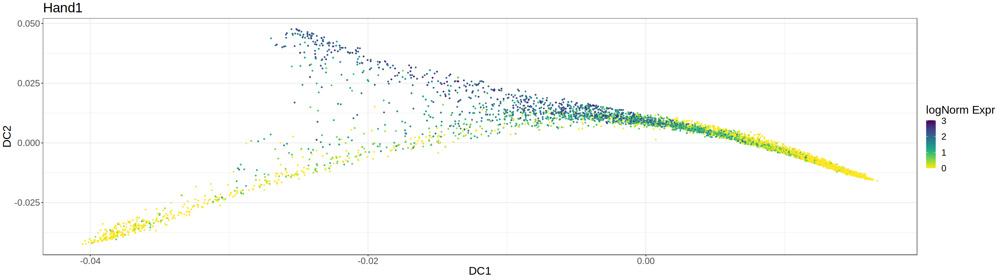

In [280]:
gene = rownames(earlyDERes)[oEarly][10]
gene = 'Hand1'
ggplot(dm.dt[match(colnames(sce_filt), cell)], aes(DC1, DC2, col=as.vector(logcounts(sce_filt[gene,])))) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis(begin=1, end=0, name='logNorm Expr') + 
    ggtitle(gene) + 
    theme_bw() + theme(text=element_text(size=20))

In [78]:
names(sce_pt)[o[1]]

[1] "Pmp22"

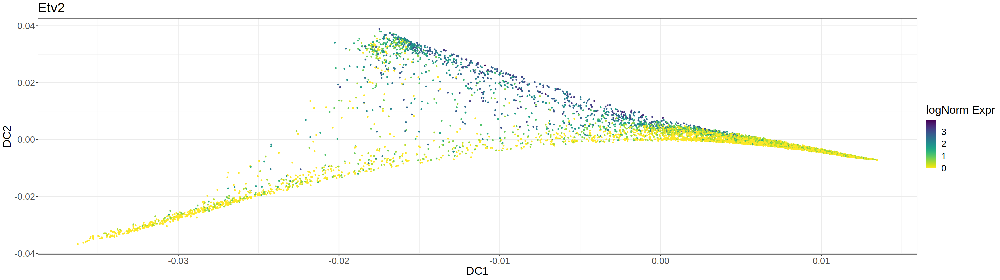

In [112]:
gene = rownames(patternRes)[oPat][15]
ggplot(dm.dt[match(colnames(sce_filt), cell)], aes(DC1, DC2, col=as.vector(logcounts(sce_filt[gene,])))) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis(begin=1, end=0, name='logNorm Expr') + 
    ggtitle(gene) + 
    theme_bw() + theme(text=element_text(size=20))

In [ ]:
ggplot(as.data.frame(colData(sce_filt)), aes(-slingPseudotime_1, as.vector(logcounts(sce_filt[gene,])), col=tdTom_corr)) + 
    geom_point(size=0.2, alpha=0.3) + 
    geom_smooth() + 
    scale_colour_manual(values=c('TRUE'='red', 'FALSE'='black'), name='Stat3 KO') + 
    ylab('logcounts') + 
    xlab('Pseudotime') + 
    ggtitle(gene) + 
    theme_bw() + 
    theme(text=element_text(size=20))#,

# With ExE mesoderm

In [2]:
#io = list()
io$atlas_sce = "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/embryo_sce.rds"
#outdir
io$outdir = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/results/blood_waves/'
dir.create(io$outdir, recursive=T, showWarning=F)

args = list()
args$celltypes = c('Nascent mesoderm', 'ExE mesoderm', 'Mixed mesoderm', 'Haematoendothelial progenitors', 'Mesenchyme') # , 'Allantois' already too late
args$features = 2500
args$npcs = 10

In [3]:
extended.sce = readRDS(io$atlas_sce)
meta = colData(extended.sce) %>% 
    as.data.table() %>% 
    .[embryo_version=='Original']
# Subset to original atlas
original_sce = extended.sce[,as.character(meta$cell)]
rm(extended.sce)

In [4]:
# Rename ensemble IDs to gene names in the atlas
gene_metadata <- fread(io$gene_metadata) %>% 
    .[,c("chr","ens_id","symbol")] %>%
     .[symbol!="" & ens_id%in%rownames(original_sce)] %>%
     .[!duplicated(symbol)]


In [5]:
original_sce <- original_sce[rownames(original_sce) %in% gene_metadata$ens_id,]
foo <- gene_metadata$symbol; names(foo) <- gene_metadata$ens_id
rownames(original_sce) <- foo[rownames(original_sce)]

In [6]:
unique(meta$celltype_PijuanSala2019)

[1] "Epiblast"                       "Primitive Streak"              
 [3] "ExE ectoderm"                   "Visceral endoderm"             
 [5] "ExE endoderm"                   "Nascent mesoderm"              
 [7] "Rostral neurectoderm"           "Blood progenitors 2"           
 [9] "Mixed mesoderm"                 "ExE mesoderm"                  
[11] "Intermediate mesoderm"          "Pharyngeal mesoderm"           
[13] "Caudal epiblast"                "PGC"                           
[15] "Mesenchyme"                     "Haematoendothelial progenitors"
[17] "Blood progenitors 1"            "Surface ectoderm"              
[19] "Gut"                            "Paraxial mesoderm"             
[21] "Caudal neurectoderm"            "Notochord"                     
[23] "Somitic mesoderm"               "Caudal Mesoderm"               
[25] "Erythroid1"                     "Def. endoderm"                 
[27] "Parietal endoderm"              "Allantois"                     
[29] "Anterior Primitive Streak"      "Endothelium"                   
[31] "Forebrain/Midbrain/Hindbrain"   "Spinal cord"                   
[33] "Cardiomyocytes"                 "Erythroid2"                    
[35] "NMP"                            "Erythroid3"                    
[37] "Neural crest"

In [125]:
keep = meta[celltype_PijuanSala2019 %in% args$celltypes] %>%
   # .[!cell %in% meta[celltype_PijuanSala2019 == 'Haematoendothelial progenitors' & stage %in% c('E8.0', 'E8.25', 'E8.5'), cell]] %>%
    .[stage%in% c('E6.5', 'E6.75', 'E7.0', 'E7.25', 'E7.5', 'E7.75')] # , 'E7.5' whithout E7.5 looks like it will also be fine

In [126]:
sce = original_sce[,as.character(keep$cell)]

In [127]:
seurat = as.Seurat(sce, data = 'counts')

In [128]:
seurat = NormalizeData(seurat)

In [129]:
sce = as.SingleCellExperiment(seurat)

In [130]:
rm(seurat)

In [131]:
decomp <- modelGeneVar(sce)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=args$features) %>% rownames

# Subset SingleCellExperiment
sce_filt <- sce[hvgs,]

In [132]:
sce_filt <- runPCA(sce_filt, ncomponents = args$npcs, ntop=args$features)
pca.dt <- reducedDim(sce_filt,"PCA") %>% round(3) %>% as.data.table(keep.rownames = T) %>% setnames("rn","cell") %>%
    merge(.,meta, by='cell')

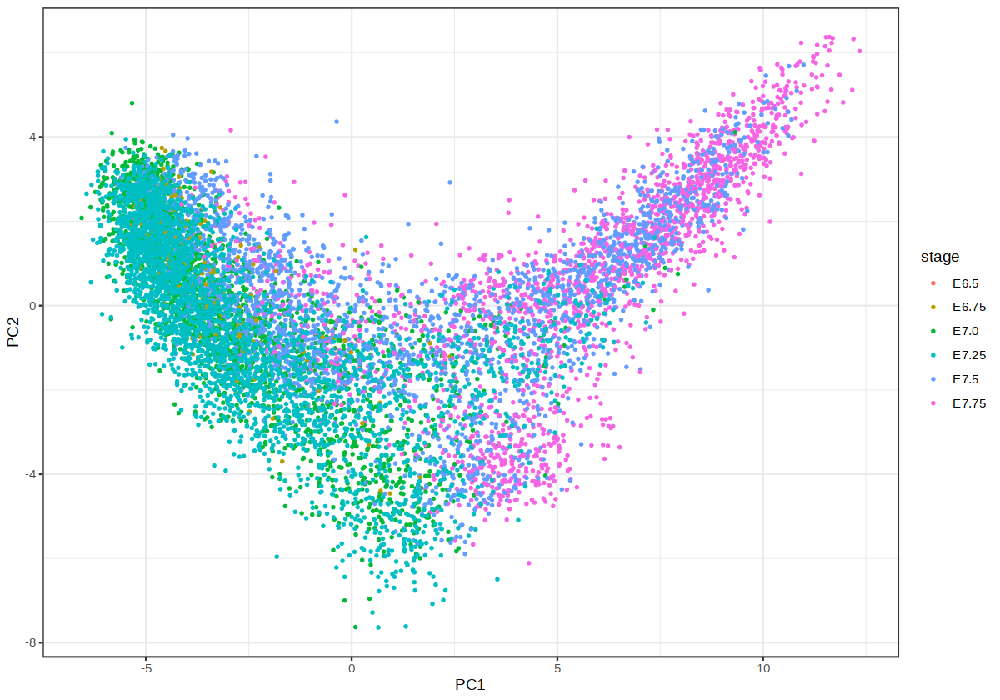

In [133]:
options(repr.plot.width=10)
ggplot(pca.dt, aes(PC1, PC2, col=stage)) + 
    geom_point(size=0.5) + 
    theme_bw()

In [134]:
dm <- DiffusionMap(reducedDim(sce_filt,"PCA")[,-2], n_pcs=args$n_pcs) # remove PC2 bc it splits too much by stage

In [135]:
dm.dt <- dm@eigenvectors[,c(1,2)] %>% round(10) %>% as.data.table(keep.rownames = T) %>% setnames("rn","cell") %>%
    merge(.,meta, by='cell')

In [136]:
opts$celltype.colors = c(
  "Nascent mesoderm" = "#C594BF",
  "Mixed mesoderm" = "#DFCDE4",
  "ExE mesoderm" = "#8870ad",
  "Mesenchyme" = "#cc7818",
  "Haematoendothelial progenitors" = "#FBBE92"
)

opts$stage.colors = c(
    "E6.5" = "#D53E4F",
    "E6.75" = "#F46D43",
    "E7.0" = "#FDAE61",
    "E7.25" = "#FEE08B",
    "E7.5" = "#FFFFBF",
    "E7.75" = "#E6F598"
)

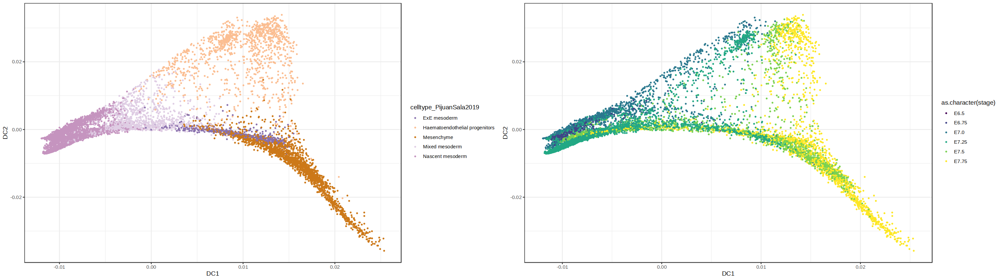

In [137]:
options(repr.plot.width=25)
p1 = ggplot(dm.dt, aes(DC1, DC2, col=celltype_PijuanSala2019)) + 
    geom_point(size=0.5) + 
    scale_color_manual(values = opts$celltype.colors) + 
    theme_bw()
p2 = ggplot(dm.dt, aes(DC1, DC2, col=as.character(stage))) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis(discrete=TRUE) + 
    theme_bw()
ggarrange(p1, p2)

### Get pseudotime

In [138]:
suppressPackageStartupMessages(library(slingshot))

In [139]:
lin1 <- getLineages(sce_filt, , clusterLabels = 'celltype_PijuanSala2019', start.clus = 'Nascent mesoderm')

Dimensionality reduction not explicitly chosen. Continuing with PCA



In [140]:
crv1 <- getCurves(lin1)

In [141]:
rd = dm@eigenvectors[,c(1,2)]

In [142]:
reducedDim(crv1, "DiffusionMap") <- dm@eigenvectors[,c(1,2)]

In [143]:
curves <- embedCurves(crv1, "DiffusionMap")
time1 <- slingCurves(curves)[[1]] # only 1 path.
time1 <- data.frame(time1$s[time1$ord,])

time2 <- slingCurves(curves)[[2]] # only 1 path.
time2 <- data.frame(time2$s[time2$ord,])

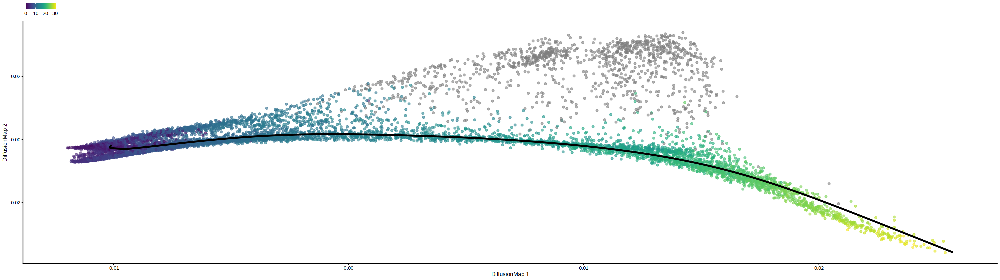

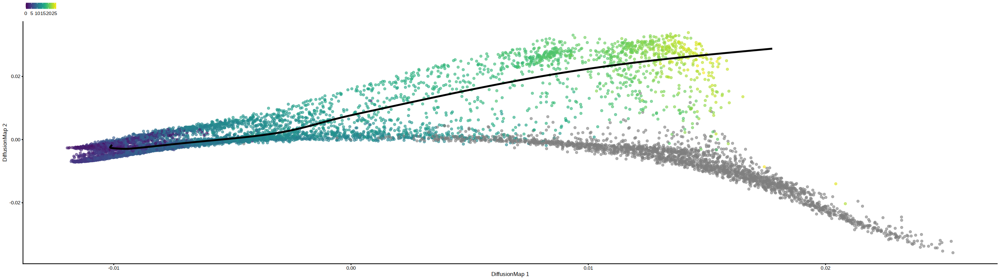

In [144]:
plotReducedDim(crv1, dimred = "DiffusionMap", colour_by="slingPseudotime_1", ncomponents = c(1,2)) +
  geom_path(data=time1, aes(x=DC1, y=DC2), size=1.2) + theme(legend.position="top", legend.title = element_blank())

plotReducedDim(crv1, dimred = "DiffusionMap", colour_by="slingPseudotime_2", ncomponents = c(1,2)) +
  geom_path(data=time2, aes(x=DC1, y=DC2), size=1.2) + theme(legend.position="top", legend.title = element_blank())

# differential expression

In [145]:
rm(lin1)

In [146]:
suppressPackageStartupMessages(library(tradeSeq))


In [147]:
# First test with only highly variable genes!! Before testing with all genes (but def do test with all)
counts = sce_filt@assays@data$counts

Warning message:
“Removed 1036 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


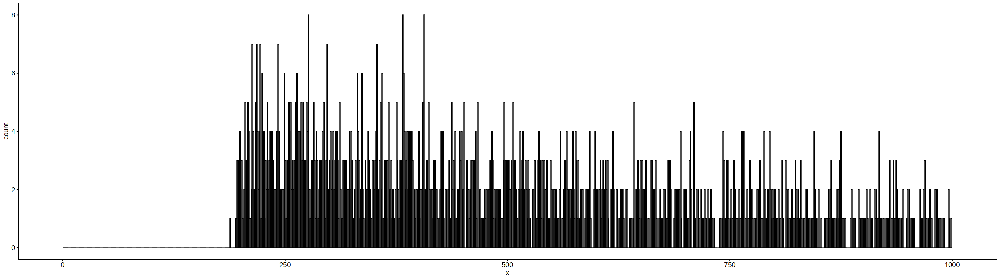

In [148]:
sum = rowSums(counts)
gghistogram(sum, bins = 1000) + xlim(0, 1000)

In [149]:
counts = counts[sum>300,]

Warning message:
“Removed 1036 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


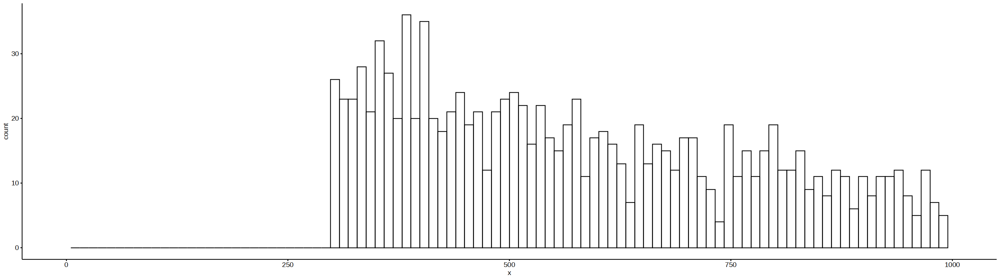

In [150]:
sum = rowSums(counts)
gghistogram(sum, bins = 100) + xlim(0, 1000)

In [151]:
CDR = data.table(gene = rownames(counts),
                 cdr = rowMeans(counts>0)) %>%
    .[cdr>0.1] %>%
    .[order(cdr)]

In [152]:
nrow(CDR)

[1] 981

In [153]:
# # incorporate this step but don't know how:
# icMat <- evaluateK(counts = counts, sds = lin1, k = 3:10, 
#                    nGenes = 200, verbose = T)

In [154]:
set.seed(7)
BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 16

pseudotime <- slingPseudotime(crv1, na = FALSE)
cellWeights <- slingCurveWeights(crv1)
sce_pt <- fitGAM(counts = counts[CDR$gene,], 
                 pseudotime = pseudotime, 
                 cellWeights = cellWeights,
                 nknots = 6, ,
                 parallel = TRUE,
                 BPPARAM=BPPARAM,
                 verbose = FALSE)

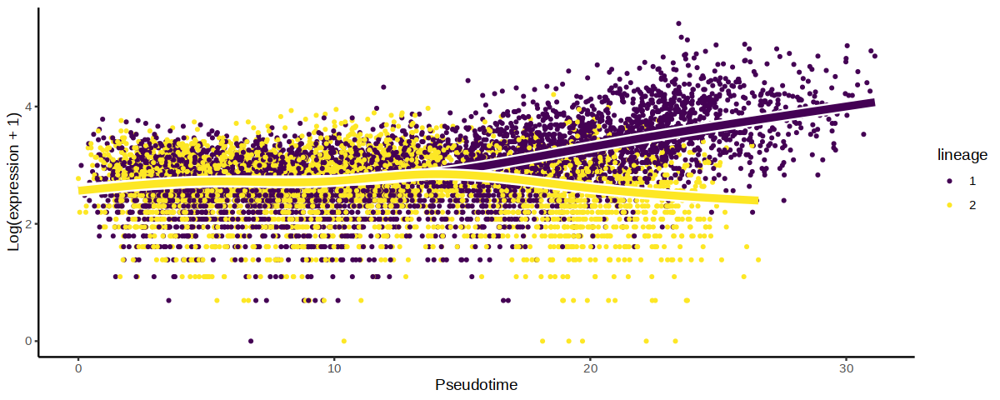

In [199]:
endRes <- diffEndTest(sce_pt)
o <- order(endRes$waldStat, decreasing = TRUE)
sigGene <- names(sce_pt)[o[1]]
plotSmoothers(sce_pt, counts, sigGene)

In [156]:
names(sce_pt)[o[5]]

[1] "Myl6"

In [157]:
patternRes <- patternTest(sce_pt)
oPat <- order(patternRes$waldStat, decreasing = TRUE)
head(rownames(patternRes)[oPat])

[1] "Krt8"   "Krt18"  "Bex3"   "Slc2a1" "Wbp5"   "Csrp2"

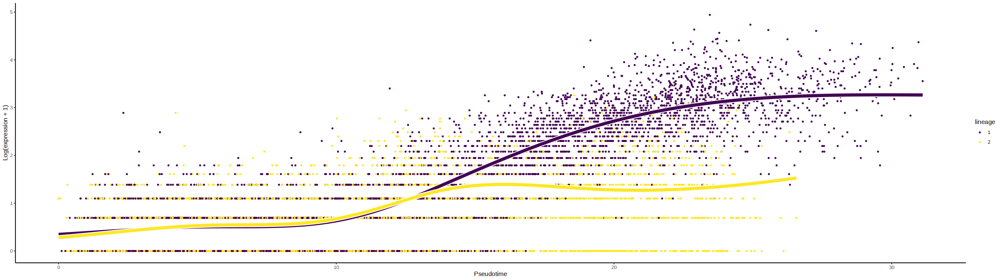

In [158]:
plotSmoothers(sce_pt, counts, gene = rownames(patternRes)[oPat][1])


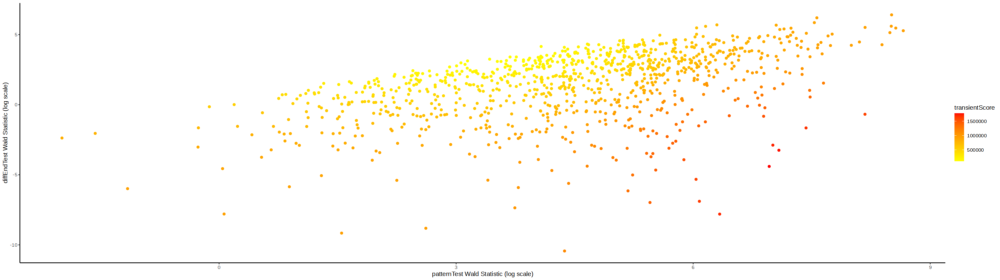

In [159]:
library(ggplot2)

patternRes$Gene <- rownames(patternRes)
patternRes$pattern <- patternRes$waldStat
patternRes <- patternRes[, c("Gene", "pattern")]

endRes$Gene <- rownames(endRes)
endRes$end <- endRes$waldStat
endRes <- endRes[, c("Gene", "end")]

compare <- merge(patternRes, endRes, by = "Gene", all = FALSE)
compare$transientScore <- 
  rank(-compare$end, ties.method = "min")^2 + rank(compare$pattern, ties.method = "random")^2

ggplot(compare, aes(x = log(pattern), y = log(end))) +
  geom_point(aes(col = transientScore)) +
  labs(x = "patternTest Wald Statistic (log scale)",
       y = "diffEndTest Wald Statistic (log scale)") +
  scale_color_continuous(low = "yellow", high = "red") +
  theme_classic()

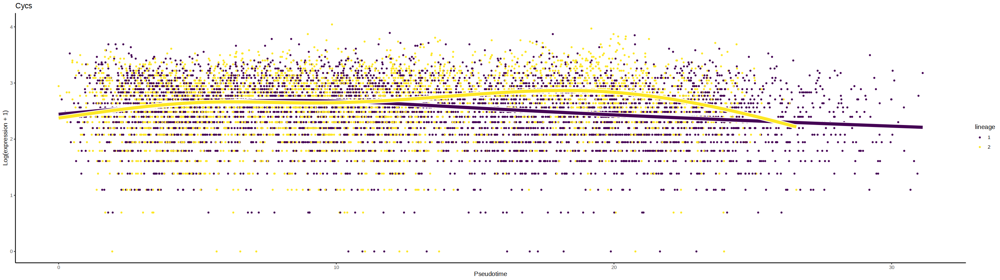

In [160]:
gene = as.data.table(compare)[order(-transientScore),Gene][1]
plotSmoothers(sce_pt, counts, gene = gene) + ggtitle(gene)

In [161]:
# This is the functino to detect the early differences!
earlyDERes <- earlyDETest(sce_pt, knots = c(1, 2))
oEarly <- order(earlyDERes$waldStat, decreasing = TRUE)
head(rownames(earlyDERes)[oEarly], 100)

[1] "Etv2"          "Ctsc"          "Calm2"         "Ppic"         
  [5] "Mest"          "Kdr"           "Tdgf1"         "Nop56"        
  [9] "Sord"          "Usp51"         "Tuba4a"        "Apoe"         
 [13] "Rbbp7"         "Twist1"        "Arpc2"         "Ifitm1"       
 [17] "Slc25a5"       "Pmp22"         "Rpl12"         "Smim1"        
 [21] "Rasgrp2"       "Prtg"          "Ldha"          "Hnrnpk"       
 [25] "Emilin1"       "Cd24a"         "Sms"           "Grrp1"        
 [29] "Fn1"           "Grsf1"         "Hoxb3os"       "Dusp6"        
 [33] "Rps12"         "Bzw1"          "Mixl1"         "Uba2"         
 [37] "Eomes"         "Slc16a3"       "Dok4"          "Car4"         
 [41] "Rgma"          "Crabp1"        "Hand1"         "Pxmp2"        
 [45] "Ptbp3"         "Lbr"           "Smtnl2"        "Car2"         
 [49] "Peg10"         "Cited1"        "Ckb"           "Zdbf2"        
 [53] "Crip2"         "Lor"           "Slc2a3"        "Lefty2"       
 [57] "H3f3a"         "Ptgfrn"        "Eno1"          "Car3"         
 [61] "Lmo1"          "Meg3"          "Hat1"          "mt-Co3"       
 [65] "Alpl"          "Wfdc2"         "Snx21"         "Bex2"         
 [69] "Cdx1"          "mt-Atp6"       "Rps20"         "Cox4i2"       
 [73] "Wdr76"         "Plac8"         "Mid1ip1"       "Aprt"         
 [77] "Galnt11"       "Rabgap1"       "Impdh2"        "Ddx5"         
 [81] "Slc43a1"       "Arfgef1"       "Ppp1r14a"      "Opn3"         
 [85] "Eif4a1"        "Rpl6"          "Pdlim4"        "Laptm4b"      
 [89] "Vstm2b"        "Isl1"          "Slc25a33"      "Plac1"        
 [93] "Capn2"         "Atp5a1"        "Rnd2"          "Comt"         
 [97] "Rap1a"         "Pcdh19"        "3632451O06Rik" "Sumo1"

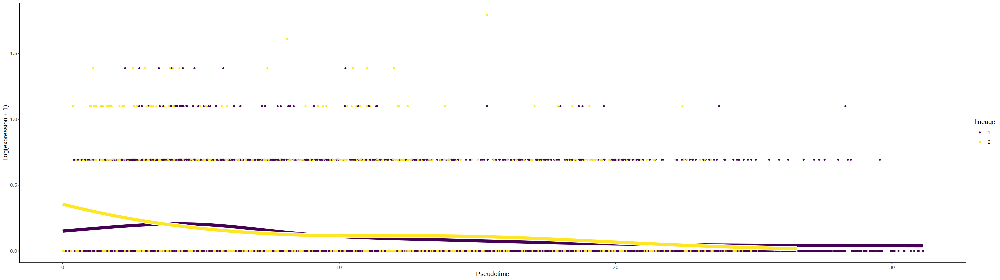

In [188]:
plotSmoothers(sce_pt, counts, gene = rownames(earlyDERes)[oEarly][11])


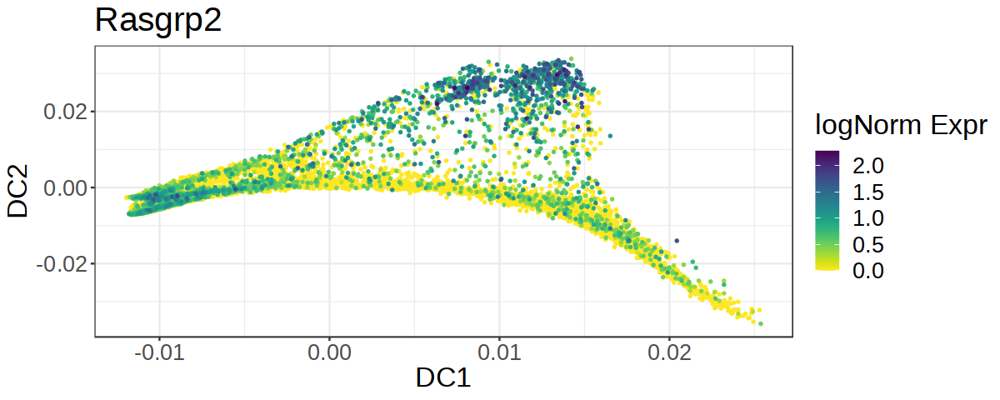

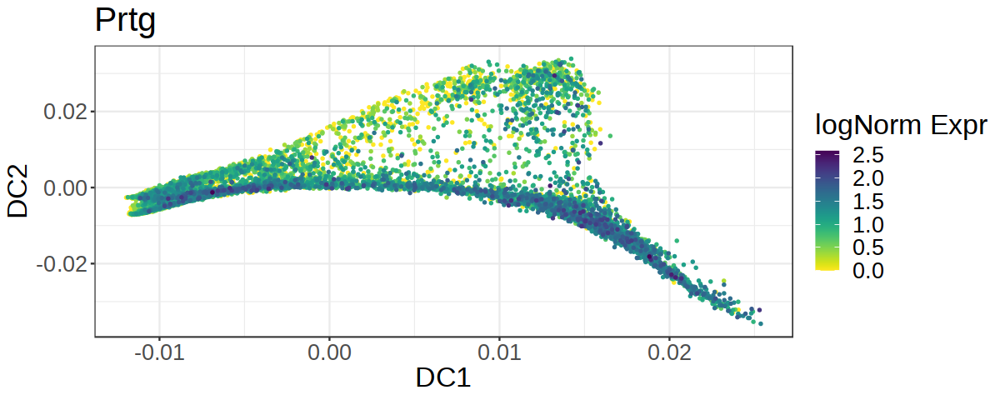

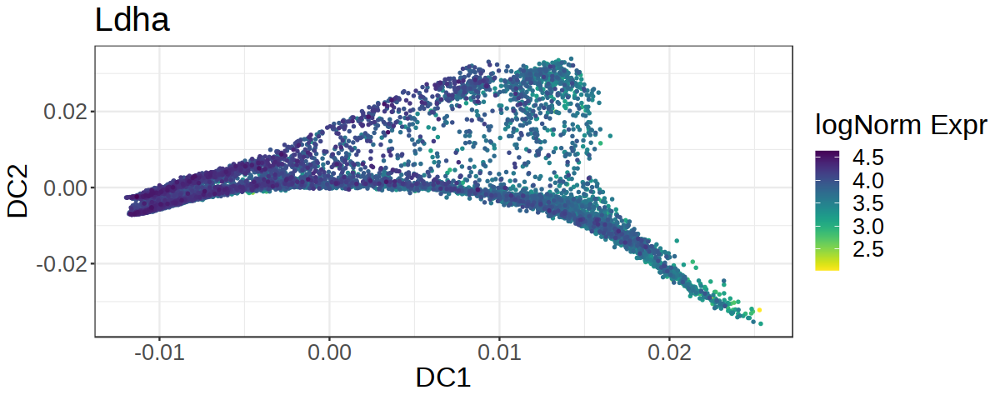

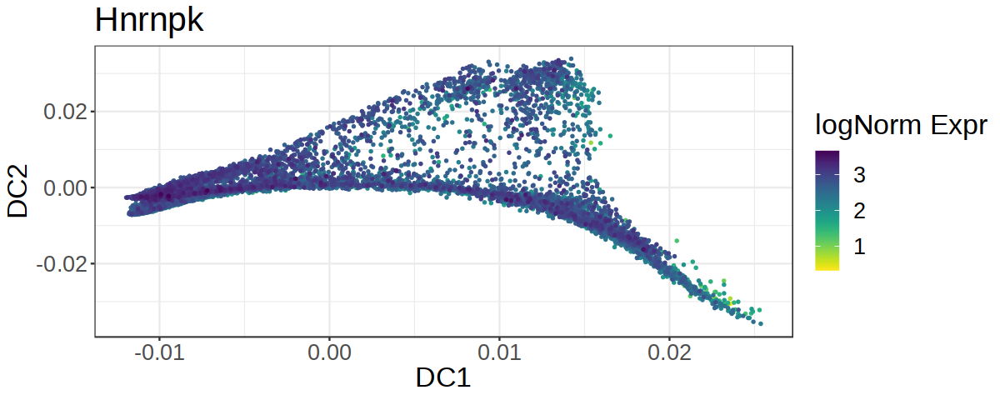

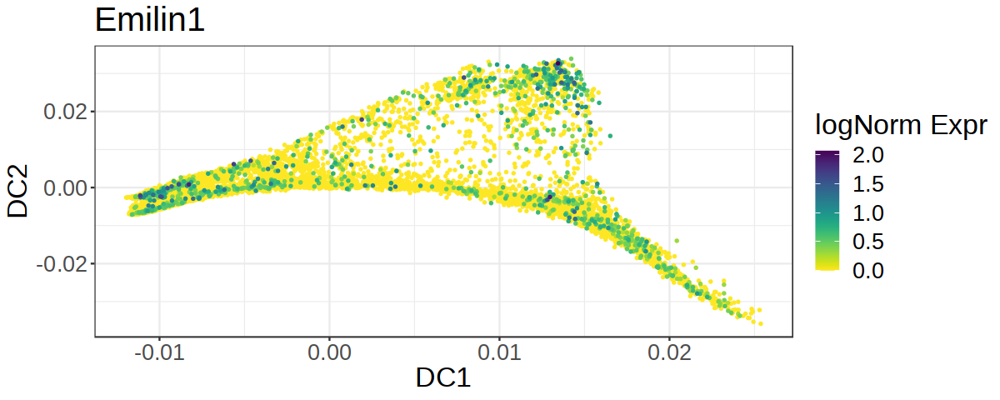

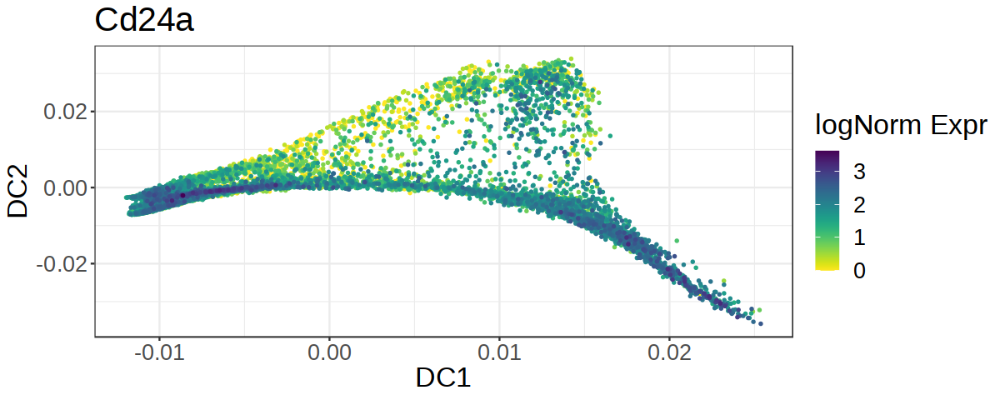

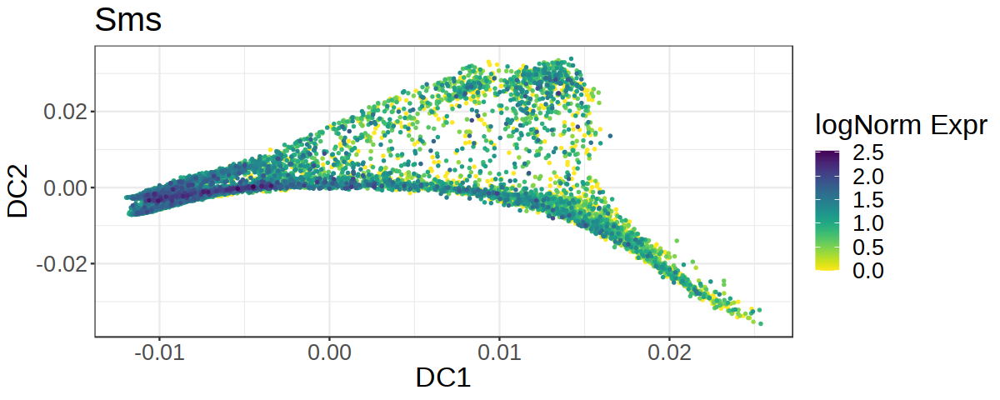

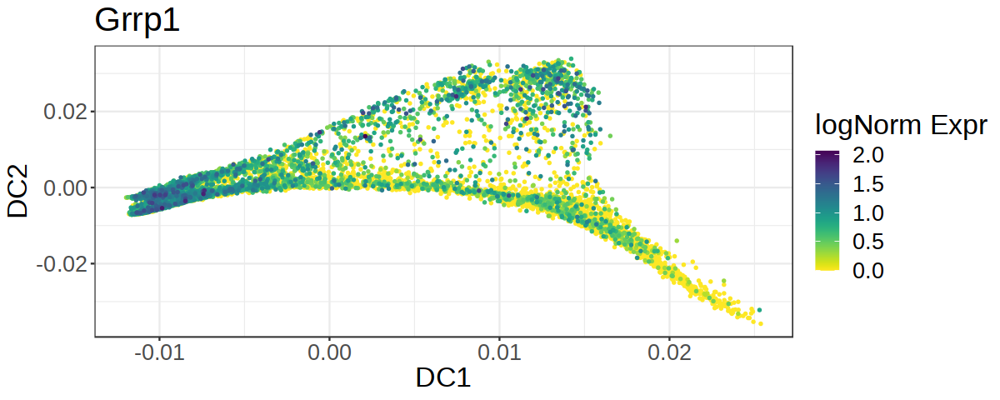

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


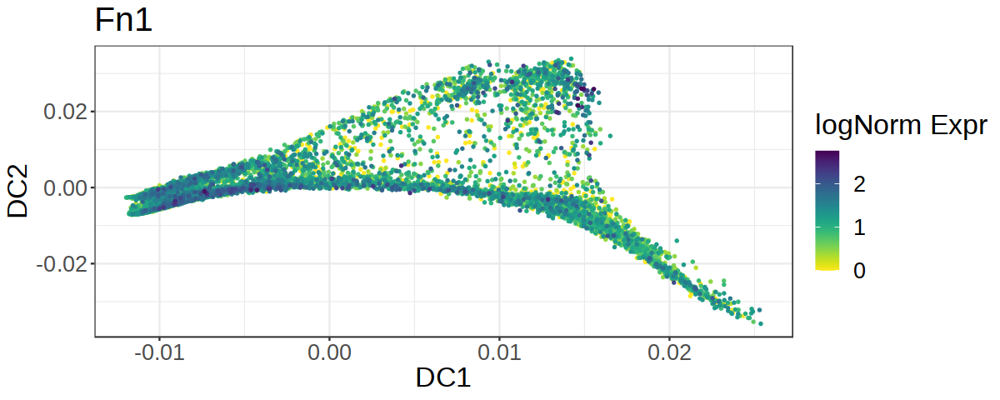

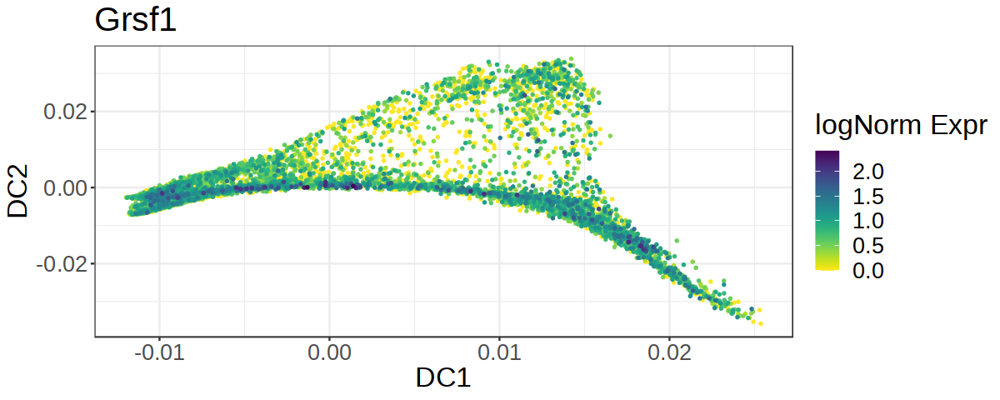

In [196]:
plot_umap = function(gene){
    to.plot = dm.dt[match(colnames(sce_filt), cell)] %>%
        .[, gene := as.vector(logcounts(sce_filt[gene,]))] %>%
        .[order(gene)]
    ggplot(to.plot, aes(DC1, DC2, col=gene)) + 
        geom_point(size=0.5) + 
        viridis::scale_color_viridis(begin=1, end=0, name='logNorm Expr') + 
        ggtitle(gene) + 
        theme_bw() + theme(text=element_text(size=20))
}
options(repr.plot.width = 10, repr.plot.height=4)
lapply(rownames(earlyDERes)[oEarly][21:30], plot_umap)

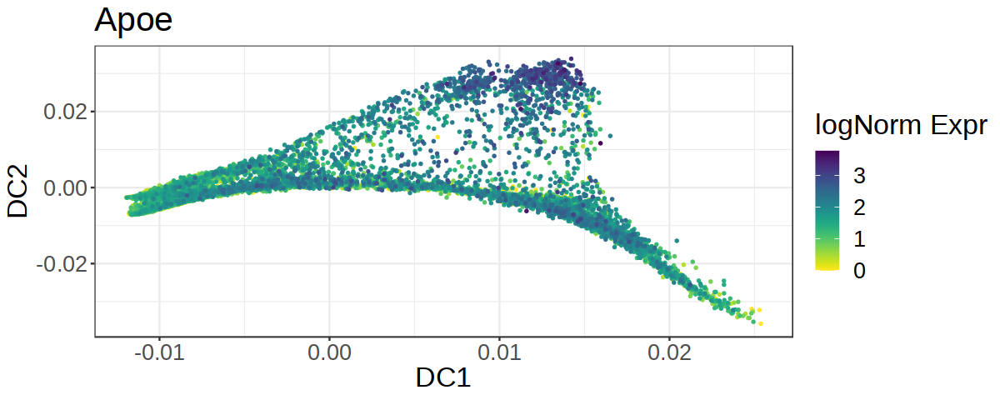

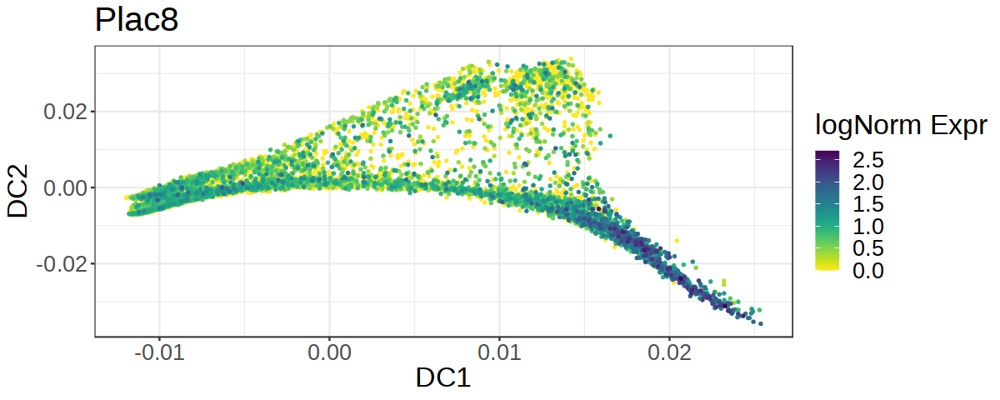

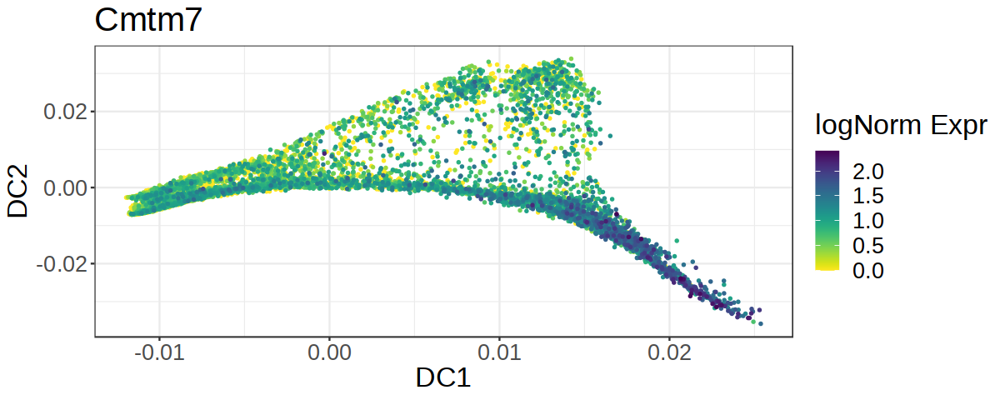

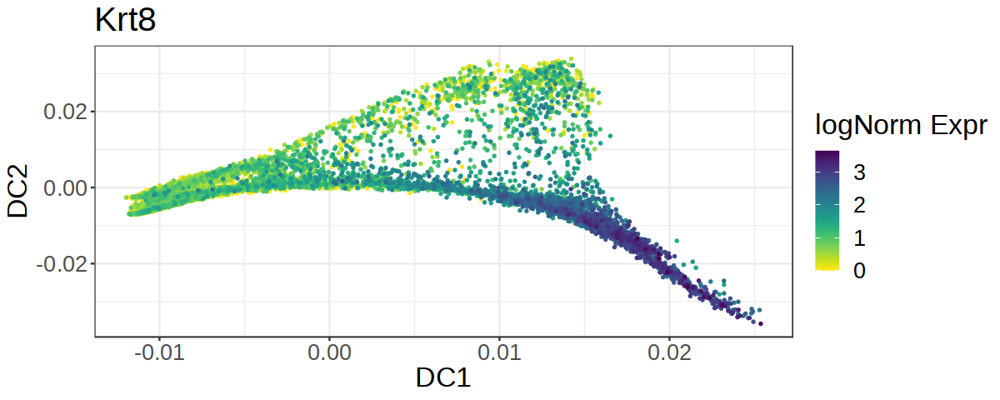

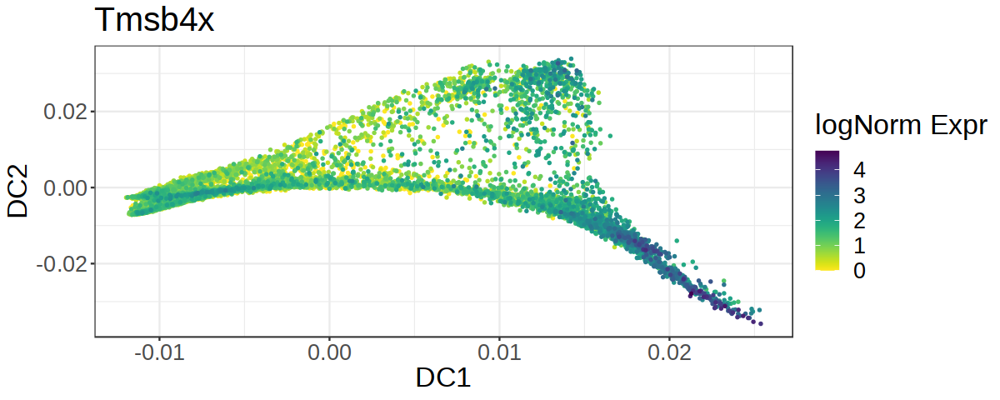

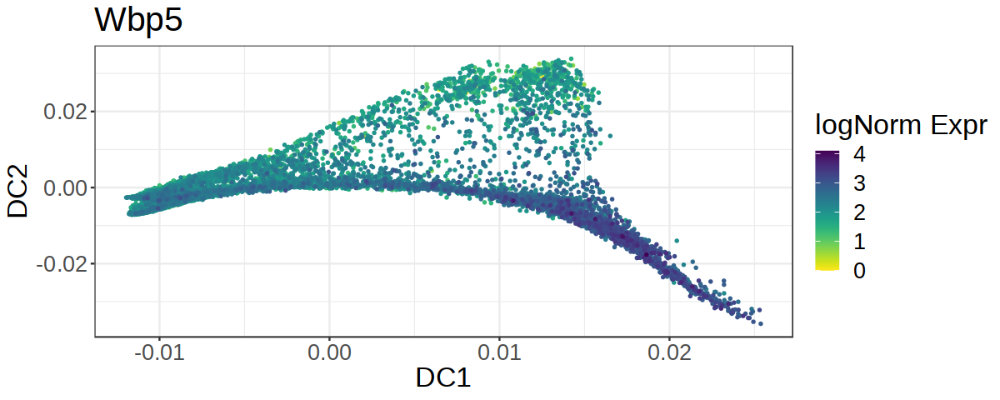

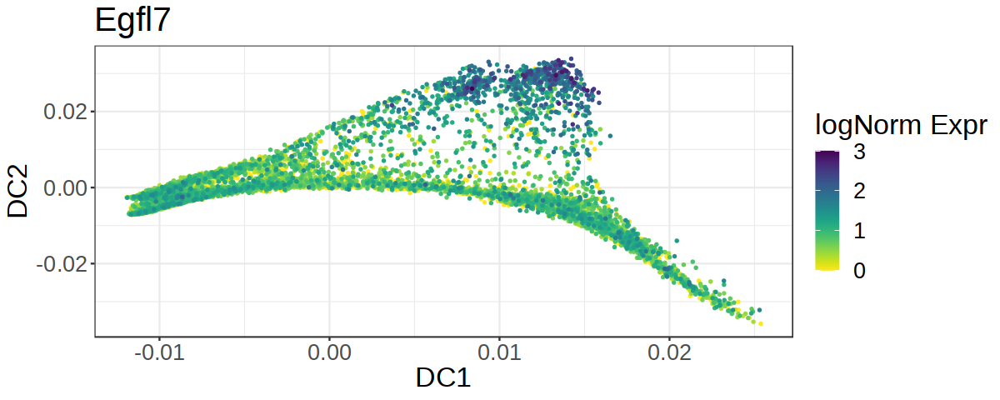

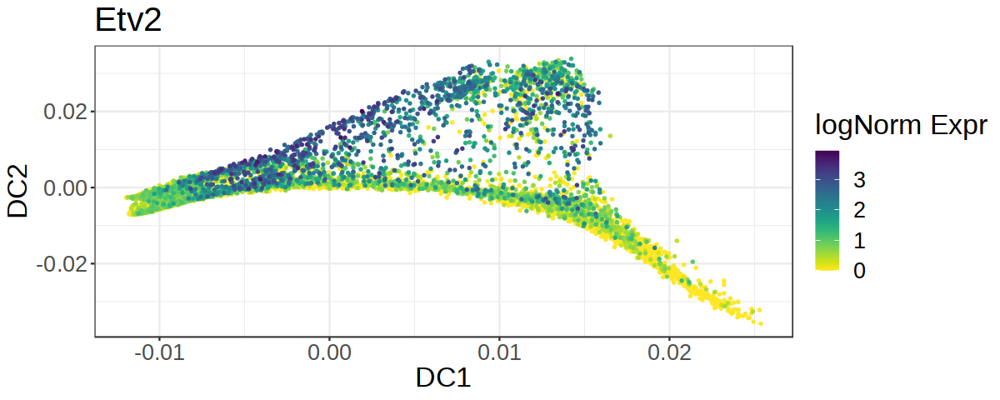

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


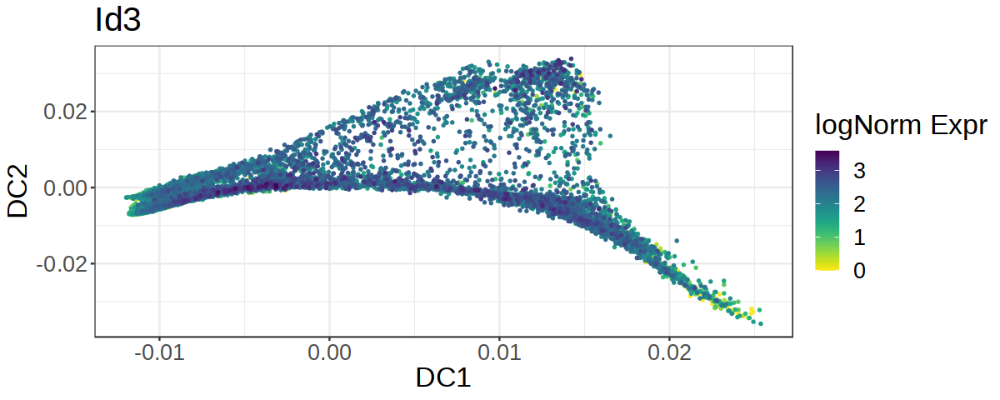

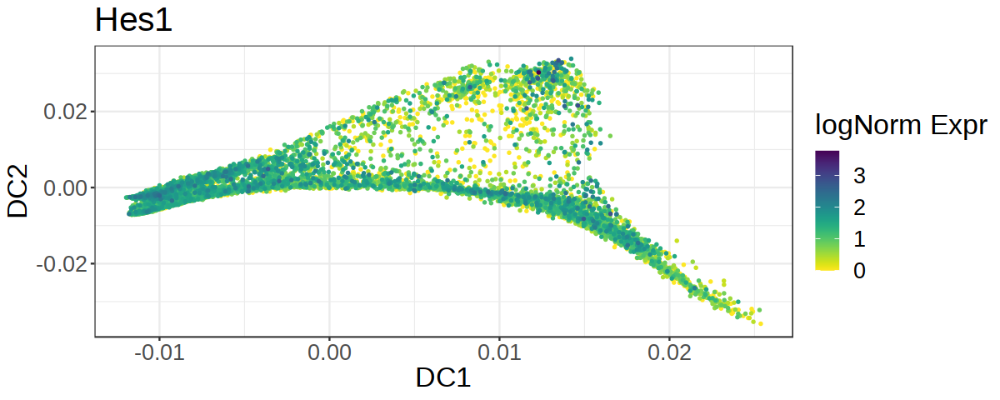

In [201]:
plot_umap = function(gene){
    to.plot = dm.dt[match(colnames(sce_filt), cell)] %>%
        .[, gene := as.vector(logcounts(sce_filt[gene,]))] %>%
        .[order(gene)]
    ggplot(to.plot, aes(DC1, DC2, col=gene)) + 
        geom_point(size=0.5) + 
        viridis::scale_color_viridis(begin=1, end=0, name='logNorm Expr') + 
        ggtitle(gene) + 
        theme_bw() + theme(text=element_text(size=20))
}
options(repr.plot.width = 10, repr.plot.height=4)
lapply(rownames(endRes)[o][11:20], plot_umap)

In [165]:
names(sce_pt)[o[1]]

[1] "Bex3"

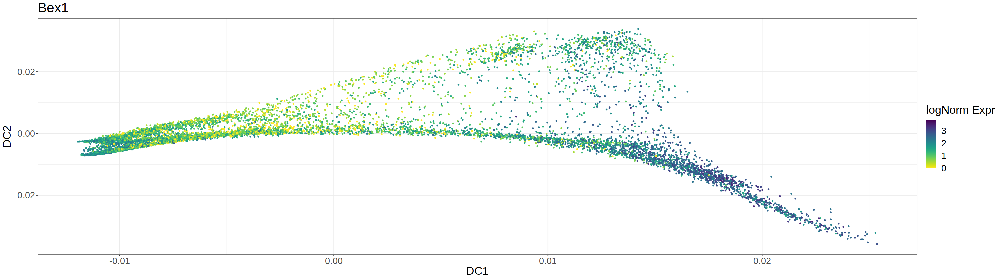

In [166]:
gene = rownames(patternRes)[oPat][15]
ggplot(dm.dt[match(colnames(sce_filt), cell)], aes(DC1, DC2, col=as.vector(logcounts(sce_filt[gene,])))) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis(begin=1, end=0, name='logNorm Expr') + 
    ggtitle(gene) + 
    theme_bw() + theme(text=element_text(size=20))

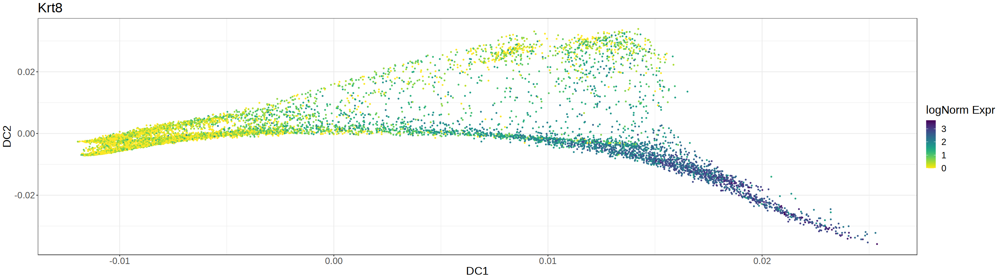

In [167]:
gene = 'Krt8'
ggplot(dm.dt[match(colnames(sce_filt), cell)], aes(DC1, DC2, col=as.vector(logcounts(sce_filt[gene,])))) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis(begin=1, end=0, name='logNorm Expr') + 
    ggtitle(gene) + 
    theme_bw() + theme(text=element_text(size=20))